In [1]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
import matplotlib.pyplot as plt
from sklearn import tree
import seaborn as sns
plt.rcParams['figure.figsize'] = (10,5)
plt.rcParams['figure.dpi'] = 1000
sns.set_theme(style='darkgrid', palette='rainbow')
import warnings
warnings.filterwarnings('ignore')

In [2]:
df = pd.read_csv('Company_Data.csv')
df

,Sales,CompPrice,Income,Advertising,Population,Price,ShelveLoc,Age,Education,Urban,US
0,9.50,138,73,11,276,120,Bad,42,17,Yes,Yes
1,11.22,111,48,16,260,83,Good,65,10,Yes,Yes
2,10.06,113,35,10,269,80,Medium,59,12,Yes,Yes
3,7.40,117,100,4,466,97,Medium,55,14,Yes,Yes
4,4.15,141,64,3,340,128,Bad,38,13,Yes,No
...,...,...,...,...,...,...,...,...,...,...,...
395,12.57,138,108,17,203,128,Good,33,14,Yes,Yes
396,6.14,139,23,3,37,120,Medium,55,11,No,Yes
397,7.41,162,26,12,368,159,Medium,40,18,Yes,Yes
398,5.94,100,79,7,284,95,Bad,50,12,Yes,Yes


In [3]:
df['Sales'].nunique()

336

In [4]:
df.duplicated().sum()

0

In [5]:
df.isna().sum()

Sales          0
CompPrice      0
Income         0
Advertising    0
Population     0
Price          0
ShelveLoc      0
Age            0
Education      0
Urban          0
US             0
dtype: int64

In [6]:
sns.pairplot(df)

In [43]:
df.loc[df['Sales']<5.0,'Sales'] = 0

In [44]:
df.loc[df['Sales'].between(5.0,10.0), 'Sales'] = 1

In [45]:
df.loc[df['Sales']>10.0, 'Sales'] = 2

In [46]:
#Here we have divided sales column in 0,1 and 2

In [47]:
df

,Sales,CompPrice,Income,Advertising,Population,Price,ShelveLoc,Age,Education,Urban,US
0,1.0,138,73,11,276,120,Bad,42,17,Yes,Yes
1,2.0,111,48,16,260,83,Good,65,10,Yes,Yes
2,2.0,113,35,10,269,80,Medium,59,12,Yes,Yes
3,1.0,117,100,4,466,97,Medium,55,14,Yes,Yes
4,0.0,141,64,3,340,128,Bad,38,13,Yes,No
...,...,...,...,...,...,...,...,...,...,...,...
395,2.0,138,108,17,203,128,Good,33,14,Yes,Yes
396,1.0,139,23,3,37,120,Medium,55,11,No,Yes
397,1.0,162,26,12,368,159,Medium,40,18,Yes,Yes
398,1.0,100,79,7,284,95,Bad,50,12,Yes,Yes


In [48]:
df['Sales'].value_counts()

Sales
1.0    245
2.0     78
0.0     77
Name: count, dtype: int64

In [49]:
df['ShelveLoc'].replace(['Bad','Medium','Good'],[0,1,2], inplace=True)
df

,Sales,CompPrice,Income,Advertising,Population,Price,ShelveLoc,Age,Education,Urban,US
0,1.0,138,73,11,276,120,0,42,17,Yes,Yes
1,2.0,111,48,16,260,83,2,65,10,Yes,Yes
2,2.0,113,35,10,269,80,1,59,12,Yes,Yes
3,1.0,117,100,4,466,97,1,55,14,Yes,Yes
4,0.0,141,64,3,340,128,0,38,13,Yes,No
...,...,...,...,...,...,...,...,...,...,...,...
395,2.0,138,108,17,203,128,2,33,14,Yes,Yes
396,1.0,139,23,3,37,120,1,55,11,No,Yes
397,1.0,162,26,12,368,159,1,40,18,Yes,Yes
398,1.0,100,79,7,284,95,0,50,12,Yes,Yes


In [50]:
df.replace(['No','Yes'], [0,1], inplace=True)
df

,Sales,CompPrice,Income,Advertising,Population,Price,ShelveLoc,Age,Education,Urban,US
0,1.0,138,73,11,276,120,0,42,17,1,1
1,2.0,111,48,16,260,83,2,65,10,1,1
2,2.0,113,35,10,269,80,1,59,12,1,1
3,1.0,117,100,4,466,97,1,55,14,1,1
4,0.0,141,64,3,340,128,0,38,13,1,0
...,...,...,...,...,...,...,...,...,...,...,...
395,2.0,138,108,17,203,128,2,33,14,1,1
396,1.0,139,23,3,37,120,1,55,11,0,1
397,1.0,162,26,12,368,159,1,40,18,1,1
398,1.0,100,79,7,284,95,0,50,12,1,1


In [51]:
x = df.iloc[:,1:]
y = df['Sales']

In [52]:
x

,CompPrice,Income,Advertising,Population,Price,ShelveLoc,Age,Education,Urban,US
0,138,73,11,276,120,0,42,17,1,1
1,111,48,16,260,83,2,65,10,1,1
2,113,35,10,269,80,1,59,12,1,1
3,117,100,4,466,97,1,55,14,1,1
4,141,64,3,340,128,0,38,13,1,0
...,...,...,...,...,...,...,...,...,...,...
395,138,108,17,203,128,2,33,14,1,1
396,139,23,3,37,120,1,55,11,0,1
397,162,26,12,368,159,1,40,18,1,1
398,100,79,7,284,95,0,50,12,1,1


In [53]:
y

0      1.0
1      2.0
2      2.0
3      1.0
4      0.0
      ... 
395    2.0
396    1.0
397    1.0
398    1.0
399    1.0
Name: Sales, Length: 400, dtype: float64

In [54]:
xtrain,xtest,ytrain,ytest = train_test_split(x,y,test_size=0.2, random_state=42)

In [55]:
xtrain

,CompPrice,Income,Advertising,Population,Price,ShelveLoc,Age,Education,Urban,US
3,117,100,4,466,97,1,55,14,1,1
18,110,110,0,408,68,2,46,17,0,1
202,121,78,4,413,130,0,46,10,0,1
250,137,105,10,435,156,2,72,14,1,1
274,135,93,2,67,119,1,34,11,1,1
...,...,...,...,...,...,...,...,...,...,...
71,148,51,16,148,150,1,58,17,0,1
106,102,33,0,217,139,1,70,18,0,0
270,119,26,0,284,89,2,26,10,1,0
348,132,102,20,459,107,2,49,11,1,1


In [56]:
ytrain

3      1.0
18     2.0
202    0.0
250    1.0
274    1.0
      ... 
71     1.0
106    0.0
270    2.0
348    2.0
102    1.0
Name: Sales, Length: 320, dtype: float64

In [57]:
RF = RandomForestClassifier()

In [58]:
RF.fit(xtrain,ytrain)

RandomForestClassifier()

In [59]:
ypred = RF.predict(xtest)
ypred

array([1., 0., 1., 1., 1., 1., 2., 1., 2., 1., 1., 1., 1., 1., 1., 1., 1.,
       2., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 0., 2., 2., 1., 1.,
       2., 1., 1., 1., 1., 0., 0., 1., 1., 1., 2., 1., 1., 1., 1., 1., 2.,
       1., 1., 2., 1., 0., 1., 2., 2., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 2., 1., 1., 1., 0., 1., 1., 1., 1., 1., 1.])

In [60]:
print(classification_report(ytest,ypred))

              precision    recall  f1-score   support

         0.0       0.83      0.36      0.50        14
         1.0       0.69      0.91      0.79        47
         2.0       0.75      0.47      0.58        19

    accuracy                           0.71        80
   macro avg       0.76      0.58      0.62        80
weighted avg       0.73      0.71      0.69        80



In [61]:
RF.score(xtrain,ytrain), RF.score(xtest,ytest)

(1.0, 0.7125)

In [62]:
params = {
    'criterion' : ['entropy', 'gini'],
    'max_depth' : [1,2],
}

In [63]:
Grid = GridSearchCV(estimator=RandomForestClassifier() , param_grid=params, verbose=1)

In [64]:
Grid.fit(xtrain,ytrain)

Fitting 5 folds for each of 4 candidates, totalling 20 fits


GridSearchCV(estimator=RandomForestClassifier(),
             param_grid={'criterion': ['entropy', 'gini'], 'max_depth': [1, 2]},
             verbose=1)

In [65]:
Grid.best_params_

{'criterion': 'gini', 'max_depth': 2}

In [66]:
RFC = RandomForestClassifier(criterion='entropy', max_depth=2)

In [67]:
RFC.fit(xtrain,ytrain)

RandomForestClassifier(criterion='entropy', max_depth=2)

In [68]:
ypred = RFC.predict(xtest)
ypred

array([1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.])

In [69]:
print(classification_report(ytest,ypred))

              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        14
         1.0       0.59      1.00      0.74        47
         2.0       0.00      0.00      0.00        19

    accuracy                           0.59        80
   macro avg       0.20      0.33      0.25        80
weighted avg       0.35      0.59      0.43        80



In [70]:
RFC.score(xtrain,ytrain), RFC.score(xtest,ytest)

(0.63125, 0.5875)

In [71]:
RFC.estimators_[0]

DecisionTreeClassifier(criterion='entropy', max_depth=2, max_features='sqrt',
                       random_state=2084616566)

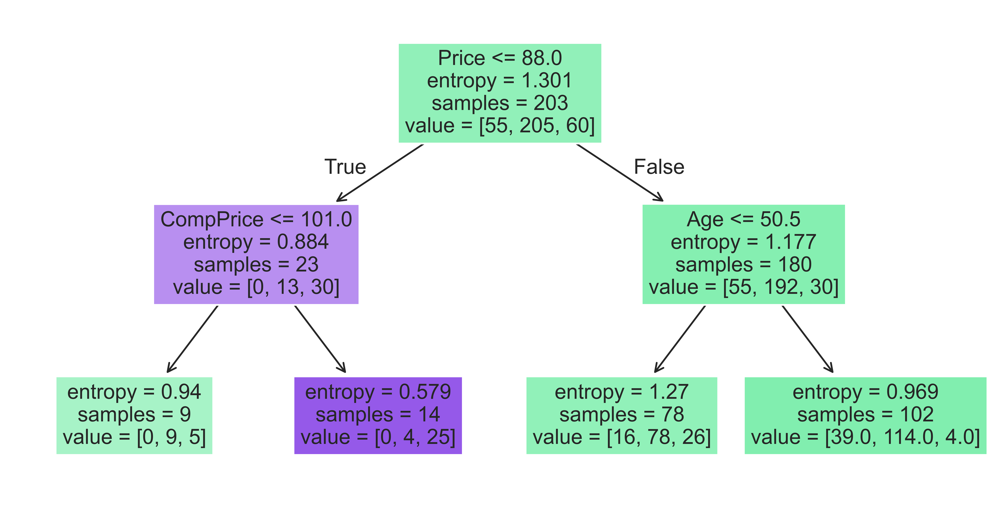

In [72]:
tree.plot_tree(RFC.estimators_[0], feature_names=list(x.columns), filled=True)
plt.show()